In [1]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import sys
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns
import random

random.seed(10)


def get_windows(job,n_neighbors):
    '''
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.
    
    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    '''
    start_time,idx,tissue_name,indices = job
    job_start = time.time()
    
    print ("Starting:", str(idx+1)+'/'+str(len(exps)),': ' + exps[idx])

    tissue = tissue_group.get_group(tissue_name)
    to_fit = tissue.loc[indices][[X,Y]].values

#     fit = NearestNeighbors(n_neighbors=n_neighbors+1).fit(tissue[[X,Y]].values)
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[[X,Y]].values)
    m = fit.kneighbors(to_fit)
#     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]

    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    sorted_indices = m[1].flatten()[args+add[:,None]]

    neighbors = tissue.index.values[sorted_indices]
   
    end_time = time.time()
   
    print ("Finishing:", str(idx+1)+"/"+str(len(exps)),": "+ exps[idx],end_time-job_start,end_time-start_time)
    return neighbors.astype(np.int32)

In [2]:
ks = [5,10,20] # k=5 means it collects 5 nearest neighbors for each center cell
path_to_data = 'csv.csv' #CA the name does not matter here other than .csv extention, we will read and combine data in the cell below
X = 'X:X'
Y = 'Y:Y'
reg = 'File Name'
file_type = 'csv'

cluster_col = 'ClusterName'
keep_cols = [X,Y,reg,cluster_col]
save_path = ''

In [3]:
#read in data and do some quick data rearrangement
n_neighbors = max(ks)
assert (file_type=='csv' or file_type =='pickle') #


if file_type == 'pickle':
    cells = pd.read_pickle(path_to_data)
if file_type == 'csv':
    #CA read data to be combined
    cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
    cells1_50 = cells1.sample(frac=0.50)
    cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
    cells2_50 = cells2.sample(frac=0.50)
    cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
    cells3_50 = cells3.sample(frac=0.50)
    
    #CA combine all data read with the next to line
cells_3groups = [cells1_50, cells2_50, cells3_50]
cells_all = pd.concat(cells_3groups)

cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

sum_cols = cells[cluster_col].unique()
values = cells[sum_cols].values
list(cells['patients'].unique())

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/2922551740.py:21: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


[13, 11, 12, 10, 9, 5, 6, 8, 4, 7, 3, 1, 2]

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:23: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.22339296340942383 0.22406005859375
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.03427696228027344 0.26729393005371094
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.07190704345703125 0.3415980339050293
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18711400032043457 0.5298550128936768
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1389780044555664 0.673886775970459
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14312481880187988 0.8201999664306641
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.14065980911254883 0.96331787109375
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.2939338684082031 1.2598469257354736
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.011847972869873047 1.2785768508911133
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03323793411254883 1.312229871749878
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1798079013824463 1.4932160377502441
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.20567893981933594 0.2064049243927002
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03464698791503906 0.24843907356262207
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07047319412231445 0.3208932876586914
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.1903688907623291 0.5121948719024658
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13906502723693848 0.6560468673706055
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14081311225891113 0.7999570369720459
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13566994667053223 0.9379801750183105
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.28692102432250977 1.227384090423584
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009329795837402344 1.2418251037597656
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.02907276153564453 1.2712340354919434
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.1674821376800537 1.439347267150879
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.20471405982971191 0.20541000366210938
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0342559814453125 0.24467897415161133
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07060813903808594 0.3172910213470459
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18314528465270996 0.5014190673828125
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1297318935394287 0.635699987411499
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1372361183166504 0.7757470607757568
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1344590187072754 0.9125728607177734
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.2813239097595215 1.1964211463928223
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.0099639892578125 1.211965799331665
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0320279598236084 1.244370937347412
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1666278839111328 1.412104845046997
Starting: 8/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.26172423362731934 0.26241421699523926
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04113483428955078 0.307750940322876
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.08433008193969727 0.3943963050842285
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.23197603225708008 0.6274940967559814
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13919496536254883 0.7720119953155518
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1481931209564209 0.9234640598297119
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.14530467987060547 1.0712847709655762
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.3007631301879883 1.3747470378875732
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010435819625854492 1.3909916877746582
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03140521049499512 1.422795057296753
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.1863420009613037 1.610328197479248
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2096850872039795 0.21037817001342773
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.034081220626831055 0.2488861083984375
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07139110565185547 0.32215404510498047
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.20099568367004395 0.5240418910980225
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13761687278747559 0.6665990352630615
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13942289352416992 0.8092021942138672
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13713598251342773 0.9487760066986084
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28464818000793457 1.235971212387085
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010009765625 1.2515578269958496
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.031960248947143555 1.283945083618164
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17116785049438477 1.4559431076049805
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.24744081497192383 0.24826288223266602
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03729701042175293 0.2906961441040039
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.08055996894836426 0.37320399284362793
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.21656394004821777 0.5908088684082031
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.16040396690368652 0.7563638687133789
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.19550704956054688 0.955456018447876
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1783459186553955 1.1367878913879395
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.32268214225769043 1.4624719619750977
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009904861450195312 1.4782729148864746
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03205704689025879 1.510697841644287
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.19621777534484863 1.7077229022979736
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.22303390502929688 0.2237229347229004
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.03428769111633301 0.26309680938720703
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.0775749683380127 0.3432810306549072
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2766540050506592 0.6216681003570557
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.14703798294067383 0.7744960784912109
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14264416694641113 0.9204208850860596
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13725018501281738 1.0602121353149414
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.3159360885620117 1.379054069519043
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.011584043502807617 1.3975372314453125
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0343470573425293 1.4324963092803955
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1741640567779541 1.607837200164795
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.21230006217956543 0.21305012702941895
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03416776657104492 0.25182485580444336
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07183408737182617 0.3256559371948242
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18804502487182617 0.514556884765625
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13659167289733887 0.6557648181915283
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14119505882263184 0.8000919818878174
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1371290683746338 0.9396140575408936
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2858431339263916 1.2279882431030273
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.009979248046875 1.2434642314910889
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030626773834228516 1.2745158672332764
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.17028570175170898 1.4455108642578125
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.21626067161560059 0.21711993217468262
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.03505897521972656 0.25808095932006836
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.0715639591217041 0.3320040702819824
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18762421607971191 0.5209269523620605
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.14878392219543457 0.6732800006866455
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1370832920074463 0.8135781288146973
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13377809524536133 0.9496140480041504
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2841639518737793 1.2363131046295166
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009870052337646484 1.2520740032196045
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.03028082847595215 1.2827320098876953
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17360377311706543 1.457223892211914
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.236954927444458 0.2376542091369629
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03463411331176758 0.27669787406921387
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07209491729736328 0.35072898864746094
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.18694305419921875 0.5386579036712646
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1347179412841797 0.6764552593231201
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.1404421329498291 0.820324182510376
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13562822341918945 0.9583160877227783
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.3125588893890381 1.2735490798950195
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010053873062133789 1.2890968322753906
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.030759096145629883 1.3202390670776367
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.17107796669006348 1.492232084274292
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21458196640014648 0.21529912948608398
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03392791748046875 0.25476884841918945
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.0723581314086914 0.32911205291748047
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18701815605163574 0.5170919895172119
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1415250301361084 0.6636829376220703
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1398153305053711 0.8065941333770752
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13637089729309082 0.9452669620513916
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.3055751323699951 1.2537250518798828
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010556936264038086 1.2700538635253906
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.034912109375 1.3053550720214844
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26683902740478516 1.5736329555511475
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.20977091789245605 0.21050190925598145
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.034197092056274414 0.2488541603088379
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07324075698852539 0.3242349624633789
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18860888481140137 0.5138449668884277
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13055706024169922 0.6481461524963379
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.1408710479736328 0.7919778823852539
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13641023635864258 0.9307441711425781
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.29291296005249023 1.2264070510864258
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01054835319519043 1.2431552410125732
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03192901611328125 1.275589942932129
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16417479515075684 1.4406640529632568
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.21451115608215332 0.21519017219543457
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03530693054199219 0.2559049129486084
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.0726480484008789 0.3312709331512451
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18779706954956055 0.5201511383056641
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1340639591217041 0.6576128005981445
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1451561450958252 0.8060421943664551
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13822627067565918 0.9466831684112549
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2887609004974365 1.2381958961486816
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009911060333251953 1.2540340423583984
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.031171798706054688 1.2856178283691406
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16848182678222656 1.4551737308502197
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.20944619178771973 0.2101271152496338
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.034124135971069336 0.24853110313415527
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07068610191345215 0.32108330726623535
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1868908405303955 0.5087521076202393
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1345658302307129 0.6477508544921875
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14387798309326172 0.794625997543335
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13646912574768066 0.9333391189575195
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2828328609466553 1.2185897827148438
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009817838668823242 1.2335550785064697
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030016183853149414 1.2639350891113281
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16724896430969238 1.4318888187408447
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2512781620025635 0.2519381046295166
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03676795959472656 0.2938690185546875
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.075042724609375 0.3709697723388672
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1910388469696045 0.5630691051483154
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13941216468811035 0.7072081565856934
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1407780647277832 0.8512310981750488
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1374959945678711 0.9910979270935059
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.2865452766418457 1.2802302837371826
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.009880781173706055 1.2954981327056885
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.030298948287963867 1.3261890411376953
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1706101894378662 1.4975001811981201
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2094860076904297 0.21015000343322754
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.034950971603393555 0.2496798038482666
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07167387008666992 0.3233821392059326
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18639898300170898 0.5106198787689209
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13411903381347656 0.6479179859161377
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14268207550048828 0.7938520908355713
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13666987419128418 0.9328711032867432
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.3708679676055908 1.3063600063323975
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010215044021606445 1.3223302364349365
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03284120559692383 1.3555610179901123
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.25653076171875 1.6131048202514648
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2564709186553955 0.2572352886199951
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.034876108169555664 0.2964761257171631
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07353878021240234 0.3722958564758301
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.20173215866088867 0.5751779079437256
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.14351940155029297 0.7258491516113281
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1415081024169922 0.8705620765686035
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13360977172851562 1.0066001415252686
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.29897594451904297 1.3082878589630127
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.009629249572753906 1.3250701427459717
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.031409263610839844 1.3569540977478027
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.17438197135925293 1.532477855682373
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.2118079662322998 0.21271824836730957
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.033232927322387695 0.25037193298339844
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.06860780715942383 0.3207437992095947
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.1873788833618164 0.508807897567749
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13399600982666016 0.6474480628967285
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13955998420715332 0.7900359630584717
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1322178840637207 0.9245707988739014
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28219008445739746 1.2091450691223145
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.012275934219360352 1.2277467250823975
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.034667015075683594 1.2628107070922852
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.1702108383178711 1.4339418411254883
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.21358704566955566 0.21440911293029785
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.033953189849853516 0.2535092830657959
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07123827934265137 0.32668423652648926
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1841590404510498 0.511775016784668
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.167633056640625 0.6839611530303955
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14983868598937988 0.83766770362854
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.14844274520874023 0.9886336326599121
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.30231308937072754 1.2931909561157227
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010978937149047852 1.3108279705047607
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03152012825012207 1.3427619934082031
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16844606399536133 1.5120580196380615
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2116701602935791 0.21235013008117676
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.05312681198120117 0.27147483825683594
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.08705520629882812 0.3630232810974121
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.19906997680664062 0.5634880065917969
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13554000854492188 0.7027928829193115
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14021706581115723 0.8464932441711426
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13761281967163086 0.9866020679473877
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2870199680328369 1.27628493309021
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009904146194458008 1.2919459342956543
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.031026124954223633 1.323425054550171
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.1685020923614502 1.4931840896606445
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2182610034942627 0.21892619132995605
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.033370018005371094 0.25673389434814453
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.0711967945098877 0.3299868106842041
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18520116806030273 0.5162312984466553
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1334390640258789 0.6542479991912842
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.1405048370361328 0.797929048538208
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13596796989440918 0.9362678527832031
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28038501739501953 1.219285011291504
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00978398323059082 1.2345879077911377
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.03039097785949707 1.2654809951782227
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16514110565185547 1.4315221309661865
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2093031406402588 0.20998501777648926
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0344541072845459 0.24973607063293457
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.0715630054473877 0.32344985008239746
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.1897871494293213 0.5143091678619385
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13519001007080078 0.6529788970947266
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13836312294006348 0.7945189476013184
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1364450454711914 0.9333431720733643
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2829906940460205 1.2189738750457764
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00940704345703125 1.234179973602295
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.030171871185302734 1.2647349834442139
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17060303688049316 1.4362690448760986
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.21449708938598633 0.21532177925109863
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03321194648742676 0.253828763961792
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07246088981628418 0.3285517692565918
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1894383430480957 0.5191681385040283
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13754510879516602 0.6620841026306152
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13993501663208008 0.805001974105835
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13693022727966309 0.9442901611328125
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.28107166290283203 1.2278966903686523
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.00987100601196289 1.2436439990997314
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.03328204154968262 1.2774009704589844
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1688079833984375 1.447357177734375
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.2007448673248291 0.20139193534851074
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03531479835510254 0.2416067123413086
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.06834721565246582 0.3124241828918457
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18457698822021484 0.497974157333374
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.12950897216796875 0.6308181285858154
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13980793952941895 0.7737109661102295
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1319129467010498 0.9079270362854004
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.27484583854675293 1.185317039489746
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009288787841796875 1.2002217769622803
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0294342041015625 1.230006217956543
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1643829345703125 1.3952488899230957
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2025148868560791 0.20316171646118164
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.032353878021240234 0.2399899959564209
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.0702509880065918 0.312258243560791
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18018007278442383 0.4933919906616211
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1339869499206543 0.6304829120635986
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13736796379089355 0.7708630561828613
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13215899467468262 0.9052751064300537
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.27957892417907715 1.1873831748962402
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009362936019897461 1.2022368907928467
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.028955936431884766 1.2315549850463867
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16548800468444824 1.397934913635254
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.2125089168548584 0.2132420539855957
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03231525421142578 0.2499692440032959
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07371306419372559 0.3256819248199463
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1881871223449707 0.5148143768310547
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1377100944519043 0.6573238372802734
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14270687103271484 0.8033599853515625
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13985705375671387 0.94582200050354
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.29764413833618164 1.2462451457977295
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009596109390258789 1.2612740993499756
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03090500831604004 1.2925539016723633
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.17069482803344727 1.463942050933838
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21235108375549316 0.21303796768188477
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.034731149673461914 0.25322699546813965
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.0710611343383789 0.32643723487854004
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.1888582706451416 0.5165112018585205
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1385190486907959 0.6602258682250977
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.15677523612976074 0.8201332092285156
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.15400218963623047 0.9776570796966553
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.291323184967041 1.2719380855560303
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009833097457885742 1.2878191471099854
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03157997131347656 1.3198788166046143
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1721479892730713 1.4929311275482178
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2084517478942871 0.2091078758239746
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03341197967529297 0.24748015403747559
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07061910629272461 0.3200409412384033
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18519282341003418 0.5063018798828125
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1360468864440918 0.6471178531646729
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1382448673248291 0.7885048389434814
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13776087760925293 0.9286298751831055
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.2856729030609131 1.2168567180633545
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00993800163269043 1.2324728965759277
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030260086059570312 1.2631120681762695
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16933107376098633 1.4333710670471191
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.2077951431274414 0.20845794677734375
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.033601999282836914 0.24690794944763184
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07134294509887695 0.3203721046447754
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18124985694885254 0.5026099681854248
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13248896598815918 0.6386208534240723
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14034008979797363 0.7821040153503418
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13802385330200195 0.9224369525909424
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28394293785095215 1.2089416980743408
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010158061981201172 1.2246379852294922
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029998064041137695 1.2550840377807617
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.171708345413208 1.427819013595581
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21520781517028809 0.2158949375152588
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.03430795669555664 0.25486302375793457
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07323098182678223 0.33016514778137207
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18593406677246094 0.5170600414276123
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1362438201904297 0.656519889831543
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14056110382080078 0.7999470233917236
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1453258991241455 0.9474599361419678
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.28029799461364746 1.2298128604888916
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009457111358642578 1.2448318004608154
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.02942514419555664 1.2746329307556152
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16919994354248047 1.4445128440856934
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.2201828956604004 0.22094488143920898
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.035691022872924805 0.26193690299987793
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07155895233154297 0.3360872268676758
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18619108200073242 0.5233368873596191
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13344311714172363 0.6618523597717285
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13924098014831543 0.804100751876831
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13670873641967773 0.9431498050689697
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.29152798652648926 1.2371621131896973
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010210990905761719 1.2532689571380615
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03084588050842285 1.2845308780670166
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.17165112495422363 1.4570159912109375


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.2055041790008545 0.20615029335021973
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03374314308166504 0.24486923217773438
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07343482971191406 0.32086706161499023
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.18815374374389648 0.5099949836730957
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1301281452178955 0.6433320045471191
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13877606391906738 0.7848162651062012
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13600587844848633 0.923011064529419
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28668689727783203 1.212357997894287
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009666204452514648 1.2278521060943604
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.0306088924407959 1.258819818496704
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17537474632263184 1.4351706504821777
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.20996904373168945 0.2106170654296875
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03448486328125 0.24947571754455566
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07228899002075195 0.32377004623413086
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18624615669250488 0.5108222961425781
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13521790504455566 0.6505060195922852
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13936185836791992 0.792747974395752
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.14478087425231934 0.9397668838500977
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28130483627319336 1.223146915435791
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009368181228637695 1.2379560470581055
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029658079147338867 1.2679619789123535
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16483497619628906 1.4334487915039062
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.201124906539917 0.20180678367614746
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.034533023834228516 0.2411971092224121
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.0746009349822998 0.3179159164428711
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18613100051879883 0.5050177574157715
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13330698013305664 0.6436080932617188
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13804006576538086 0.7845890522003174
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13560795783996582 0.9224660396575928
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2843139171600342 1.2093510627746582
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009865045547485352 1.2247543334960938
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.03137993812561035 1.2565181255340576
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1701507568359375 1.4274108409881592
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21046805381774902 0.21113109588623047
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03339123725891113 0.2490999698638916
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07251191139221191 0.32344985008239746
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.19462919235229492 0.5190582275390625
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13895893096923828 0.6613290309906006
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14301061630249023 0.807506799697876
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1331472396850586 0.9430122375488281
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.29169797897338867 1.2371728420257568
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009567022323608398 1.2521610260009766
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029181957244873047 1.281682014465332
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1658172607421875 1.4484412670135498
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.254040002822876 0.2547321319580078
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03571200370788574 0.2955167293548584
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07398295402526855 0.3717231750488281
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18991374969482422 0.5627157688140869
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.14794921875 0.7140390872955322
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14648127555847168 0.8636252880096436
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.15849065780639648 1.0244357585906982
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.35905885696411133 1.3862810134887695
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.010392904281616211 1.4035320281982422
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03109884262084961 1.4351670742034912
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.20480823516845703 1.6411471366882324
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21152997016906738 0.21221494674682617
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.034136056900024414 0.25092101097106934
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07242608070373535 0.32528114318847656
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18872523307800293 0.5148930549621582
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13698101043701172 0.6567678451538086
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.1545860767364502 0.814608097076416
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.15291094779968262 0.9706659317016602
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.3006000518798828 1.274306058883667
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009494781494140625 1.2897617816925049
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03011608123779297 1.3202550411224365
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1708841323852539 1.4922311305999756
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21024703979492188 0.21089386940002441
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03250885009765625 0.2486579418182373
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07179427146911621 0.3224520683288574
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18760895729064941 0.5111789703369141
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13347983360290527 0.6499588489532471
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13878083229064941 0.7918572425842285
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.14624476432800293 0.9404847621917725
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.28064680099487305 1.2235116958618164
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.009965896606445312 1.2394819259643555
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03061199188232422 1.2704761028289795
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.1750950813293457 1.4465179443359375
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2065720558166504 0.20725607872009277
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.032868146896362305 0.2451930046081543
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.0712440013885498 0.3183290958404541
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18220019340515137 0.5014221668243408
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1318502426147461 0.6380720138549805
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13874101638793945 0.7802681922912598
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1355578899383545 0.9185061454772949
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.28390979766845703 1.2049448490142822
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009490013122558594 1.2201380729675293
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029247045516967773 1.2497518062591553
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16926288604736328 1.419708013534546
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.22275996208190918 0.2236928939819336
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03460097312927246 0.2633242607116699
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.0709841251373291 0.3363819122314453
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18825602531433105 0.5259110927581787
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1549360752105713 0.6879141330718994
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14470720291137695 0.8359541893005371
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.14770030975341797 0.9861600399017334
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2846510410308838 1.2732648849487305
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.009959936141967773 1.2890408039093018
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03104114532470703 1.3203611373901367
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17032599449157715 1.4914040565490723
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2236638069152832 0.22433876991271973
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03426098823547363 0.2638969421386719
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07209897041320801 0.33840084075927734
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18515872955322266 0.5246016979217529
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1338512897491455 0.6618320941925049
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1413559913635254 0.8063149452209473
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1376338005065918 0.9463968276977539
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.29137372970581055 1.2405588626861572
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.009528160095214844 1.255815029144287
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03015613555908203 1.2863550186157227
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16795015335083008 1.4553461074829102
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.20789289474487305 0.20855712890625
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0343623161315918 0.24776291847229004
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07172799110412598 0.32164502143859863
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18317723274230957 0.5056493282318115
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1578049659729004 0.6664910316467285
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14448189735412598 0.8140208721160889
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13673019409179688 0.9530689716339111
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.3063182830810547 1.262012004852295
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009956836700439453 1.2775428295135498
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03006267547607422 1.3079817295074463
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16757822036743164 1.4762520790100098
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21991801261901855 0.22059416770935059
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.03976559638977051 0.2649977207183838
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07749199867248535 0.3451399803161621
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.21051907539367676 0.5566320419311523
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13988780975341797 0.7001028060913086
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.15697288513183594 0.8602678775787354
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.15484285354614258 1.022885799407959
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.34429216384887695 1.3769478797912598
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019572019577026367 1.408282995223999
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04354572296142578 1.4527788162231445
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.22990202903747559 1.6838641166687012
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2102677822113037 0.21094179153442383
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03449606895446777 0.24970293045043945
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07243180274963379 0.3243746757507324
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.19049978256225586 0.5158379077911377
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1371450424194336 0.6568372249603271
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.1403031349182129 0.8002891540527344
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13842296600341797 0.9411048889160156
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.29575610160827637 1.2395117282867432
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.009791135787963867 1.255255937576294
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030826091766357422 1.286463975906372
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.1783437728881836 1.4657950401306152
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21070003509521484 0.21140503883361816
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03300786018371582 0.24915194511413574
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.0693509578704834 0.3204479217529297
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18364596366882324 0.5049879550933838
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13203096389770508 0.6432130336761475
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.137009859085083 0.7832379341125488
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13454985618591309 0.9200639724731445
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.281735897064209 1.2045550346374512
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00978994369506836 1.2198588848114014
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.03234100341796875 1.2525639533996582
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1728971004486084 1.4263970851898193
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.21709322929382324 0.21776413917541504
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03379082679748535 0.25638794898986816
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07407689094543457 0.3326389789581299
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1824939250946045 0.5162949562072754
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13463211059570312 0.6557531356811523
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13721013069152832 0.7962613105773926
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13114595413208008 0.9297189712524414
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.28310394287109375 1.2153358459472656
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009613990783691406 1.230647087097168
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.0301361083984375 1.2611520290374756
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17268824577331543 1.4348502159118652
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.20473599433898926 0.2053990364074707
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03314614295959473 0.24303531646728516
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07519912719726562 0.3201169967651367
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.18737483024597168 0.5086569786071777
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1368849277496338 0.6507089138031006
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14338302612304688 0.7973387241363525
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1378171443939209 0.9377789497375488
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.29493093490600586 1.2352967262268066
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00977182388305664 1.25077486038208
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.03313779830932617 1.2843017578125
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1850879192352295 1.4704079627990723
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.20510578155517578 0.20577788352966309
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.03148388862609863 0.24212980270385742
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.06778597831726074 0.31171298027038574
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.19027090072631836 0.5028352737426758
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13478398323059082 0.6406400203704834
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1357278823852539 0.7793149948120117
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.12919116020202637 0.9110453128814697
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.27455592155456543 1.1880288124084473
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009725093841552734 1.203212022781372
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03029799461364746 1.2338578701019287
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.16872191429138184 1.4035470485687256


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.22491693496704102 0.22582507133483887
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.035407066345214844 0.2660820484161377
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07288813591003418 0.34105706214904785
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18714332580566406 0.529177188873291
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1364758014678955 0.668848991394043
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14867019653320312 0.8205771446228027
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13652706146240234 0.9595110416412354
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2812478542327881 1.2433626651763916
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01012420654296875 1.2590892314910889
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03309297561645508 1.2925798892974854
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1769859790802002 1.4703369140625
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.2192528247833252 0.22007012367248535
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03599715232849121 0.26172304153442383
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07320809364318848 0.3370552062988281
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.19124484062194824 0.5294818878173828
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13477301597595215 0.6678330898284912
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14181089401245117 0.8127670288085938
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1414783000946045 0.9568061828613281
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.29666709899902344 1.256453275680542
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010533809661865234 1.2728970050811768
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.030877113342285156 1.3042330741882324
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17374515533447266 1.4789879322052002
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.26105380058288574 0.2619309425354004
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04144597053527832 0.3079860210418701
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.09290099143981934 0.4034712314605713
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2182610034942627 0.6237249374389648
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.14727401733398438 0.7759442329406738
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.15384602546691895 0.9340729713439941
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1463160514831543 1.0828511714935303
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.39360904693603516 1.4793951511383057
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.009788990020751953 1.4972460269927979
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.03804183006286621 1.5360028743743896
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.1729719638824463 1.7099950313568115
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21174311637878418 0.21239399909973145
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03571200370788574 0.2525959014892578
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.0718390941619873 0.32644200325012207
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18524694442749023 0.5126001834869385
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1353747844696045 0.6510987281799316
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1401231288909912 0.7946391105651855
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13538622856140137 0.9324092864990234
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.28560471534729004 1.2207889556884766
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010327816009521484 1.2365827560424805
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03031015396118164 1.2672889232635498
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16797304153442383 1.4359772205352783
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.2097759246826172 0.21046686172485352
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0371856689453125 0.2528069019317627
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07269811630249023 0.3277010917663574
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.1877899169921875 0.516448974609375
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13849925994873047 0.6596040725708008
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13933110237121582 0.8020579814910889
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13772296905517578 0.9421160221099854
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.29148006439208984 1.2361969947814941
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009959220886230469 1.2515439987182617
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.030231952667236328 1.2821578979492188
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16916394233703613 1.4520039558410645
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.21219682693481445 0.21287965774536133
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03442096710205078 0.2522449493408203
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07207989692687988 0.32619690895080566
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.1853938102722168 0.5124070644378662
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13379812240600586 0.649399995803833
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14052605628967285 0.7930300235748291
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13479185104370117 0.9301259517669678
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.30834412574768066 1.241055965423584
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009695768356323242 1.256201982498169
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029754161834716797 1.2863209247589111
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.17037415504455566 1.4573569297790527
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21375226974487305 0.21455121040344238
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.03313112258911133 0.2527480125427246
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.070587158203125 0.32517194747924805
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18267130851745605 0.5086162090301514
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13618206977844238 0.6493260860443115
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13904500007629395 0.7911980152130127
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13232994079589844 0.9257621765136719
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.27888011932373047 1.2071521282196045
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009524822235107422 1.2222709655761719
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029613018035888672 1.25223708152771
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16646766662597656 1.419367790222168
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.22057390213012695 0.22124600410461426
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.033451080322265625 0.2594728469848633
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07353782653808594 0.33507204055786133
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.1989603042602539 0.5351862907409668
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.14322805404663086 0.6846210956573486
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.152313232421875 0.8400640487670898
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1682748794555664 1.0107989311218262
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.303225040435791 1.3167009353637695
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01001596450805664 1.332486867904663
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.03292489051818848 1.3657739162445068
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.18088912963867188 1.547624111175537
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21191096305847168 0.21261000633239746
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03373122215270996 0.2515699863433838
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07024502754211426 0.3241913318634033
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.17780613899230957 0.5033431053161621
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13866305351257324 0.6469590663909912
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14040017127990723 0.7905411720275879
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1348857879638672 0.9279501438140869
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.27568626403808594 1.2062771320343018
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009601116180419922 1.2222511768341064
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03179597854614258 1.254429817199707
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1654059886932373 1.4211981296539307
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.21474790573120117 0.2154080867767334
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03356003761291504 0.25420188903808594
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07114887237548828 0.3276641368865967
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18807291984558105 0.5169148445129395
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13523411750793457 0.655911922454834
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.1400890350341797 0.7996060848236084
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13539910316467285 0.9374120235443115
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2905139923095703 1.23046875
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010126113891601562 1.2463338375091553
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030326128005981445 1.2770330905914307
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1711130142211914 1.4492239952087402
Starting: 6

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.21180391311645508 0.21248507499694824
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03248906135559082 0.2496020793914795
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07137727737426758 0.32300710678100586
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18082785606384277 0.5052320957183838
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13552093505859375 0.6440150737762451
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13856101036071777 0.7857520580291748
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13704800605773926 0.9252209663391113
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.2874288558959961 1.2152118682861328
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00993204116821289 1.23091721534729
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.030857086181640625 1.2621471881866455
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.172760009765625 1.4358980655670166
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2119460105895996 0.21262693405151367
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03372907638549805 0.25150108337402344
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07091403007507324 0.3247518539428711
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.19352507591247559 0.5192811489105225
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13394808769226074 0.6569280624389648
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13810014724731445 0.7983748912811279
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.14913201332092285 0.9498937129974365
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.29325413703918457 1.2456371784210205
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010526895523071289 1.262253999710083
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.031009197235107422 1.2936482429504395
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.17078232765197754 1.4653611183166504


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.20875811576843262 0.20944786071777344
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03396177291870117 0.24871182441711426
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07508373260498047 0.32626986503601074
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.1899709701538086 0.5174100399017334
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13446497917175293 0.6553788185119629
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13925600051879883 0.7977180480957031
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1373898983001709 0.937546968460083
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.28919291496276855 1.2292978763580322
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.009763002395629883 1.2449159622192383
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.031313180923461914 1.276595115661621
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1681687831878662 1.4455819129943848
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.21129703521728516 0.21219301223754883
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.034240007400512695 0.251554012298584
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07031393051147461 0.3240230083465576
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18653082847595215 0.5115540027618408
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13659000396728516 0.6514239311218262
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14040803909301758 0.7951171398162842
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13747787475585938 0.9351749420166016
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2855370044708252 1.2233309745788574
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010499238967895508 1.2397840023040771
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.03183889389038086 1.271996021270752
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.17292523384094238 1.445979118347168
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21075820922851562 0.21161913871765137
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.03417396545410156 0.2512829303741455
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07134294509887695 0.3251008987426758
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18945813179016113 0.5156960487365723
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13882017135620117 0.6580049991607666
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.1546170711517334 0.8164231777191162
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1528172492980957 0.9716250896453857
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.2995901107788086 1.273583173751831
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010592937469482422 1.2904069423675537
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03220415115356445 1.3229951858520508
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.17764806747436523 1.5016870498657227
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.20474481582641602 0.20541000366210938
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0329899787902832 0.24269890785217285
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.06981134414672852 0.31437015533447266
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18332695960998535 0.49854588508605957
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.15605401992797852 0.6598470211029053
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14220809936523438 0.805340051651001
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13574814796447754 0.943418025970459
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28630614280700684 1.2323882579803467
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009623050689697266 1.248854160308838
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030276060104370117 1.2795052528381348
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.17170405387878418 1.451888084411621
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21745991706848145 0.21816277503967285
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03551983833312988 0.2580728530883789
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07547497749328613 0.3355851173400879
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.19215106964111328 0.5287129878997803
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.14294219017028809 0.6776461601257324
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.1428511142730713 0.823976993560791
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.14674997329711914 0.9731159210205078
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.2908749580383301 1.266916275024414
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00941014289855957 1.2817718982696533
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.034696102142333984 1.3168768882751465
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16695308685302734 1.4848577976226807
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.21379780769348145 0.21469998359680176
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03341507911682129 0.25273704528808594
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07212591171264648 0.3267018795013428
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.1957852840423584 0.5234041213989258
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13857793807983398 0.6656558513641357
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14073705673217773 0.8097829818725586
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13669204711914062 0.9488561153411865
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.28543519973754883 1.236908197402954
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01000666618347168 1.2526109218597412
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.030191898345947266 1.2832019329071045
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16844797134399414 1.4523730278015137
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21279311180114746 0.21346306800842285
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0327448844909668 0.25098180770874023
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.0706629753112793 0.32408714294433594
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.19939780235290527 0.5243628025054932
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13529586791992188 0.6630668640136719
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13946866989135742 0.8059008121490479
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1354360580444336 0.9437158107757568
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2901308536529541 1.2363629341125488
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009803056716918945 1.2517812252044678
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.0299530029296875 1.2821152210235596
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17038893699645996 1.4533300399780273
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.210968017578125 0.21174407005310059
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03453969955444336 0.25122690200805664
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07202410697937012 0.32563304901123047
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18802404403686523 0.5148310661315918
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13641023635864258 0.6546909809112549
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13826894760131836 0.796058177947998
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13643598556518555 0.9349648952484131
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2840750217437744 1.2216551303863525
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.009758949279785156 1.2376770973205566
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030132055282592773 1.2682030200958252
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.17119693756103516 1.4405410289764404
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2122020721435547 0.21286416053771973
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03405427932739258 0.2523341178894043
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07320785522460938 0.32802391052246094
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1898360252380371 0.5193097591400146
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13628172874450684 0.6590750217437744
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14017415046691895 0.802436113357544
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13731026649475098 0.9420762062072754
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.2909128665924072 1.235630989074707
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.010514974594116211 1.2519490718841553
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03386497497558594 1.2862379550933838
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17258596420288086 1.4601709842681885
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2100841999053955 0.21075010299682617
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.03420710563659668 0.24997997283935547
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07278800010681152 0.3251781463623047
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18813419342041016 0.5144381523132324
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13963913917541504 0.6582369804382324
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14257597923278809 0.8040528297424316
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.14060711860656738 0.9470601081848145
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2803359031677246 1.2300119400024414
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009502172470092773 1.245483160018921
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030025005340576172 1.2759768962860107
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16787004470825195 1.4448959827423096
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.2053089141845703 0.20598793029785156
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03538632392883301 0.24589323997497559
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07473301887512207 0.32286691665649414
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.19646716117858887 0.5205192565917969
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13959121704101562 0.6633572578430176
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14303112030029297 0.8097140789031982
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13646268844604492 0.9486637115478516
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.30249714851379395 1.2537622451782227
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010517120361328125 1.2699949741363525
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.03165173530578613 1.302103042602539
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.17602896690368652 1.4793150424957275


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.22041082382202148 0.2211771011352539
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0337071418762207 0.2595200538635254
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07135391235351562 0.3327639102935791
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18640899658203125 0.520071268081665
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13557100296020508 0.658776044845581
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14069032669067383 0.8026449680328369
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13522601127624512 0.9402930736541748
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2803332805633545 1.2230720520019531
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009773015975952148 1.238325834274292
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.030691862106323242 1.2693901062011719
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16746902465820312 1.437554121017456
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.20920801162719727 0.20995807647705078
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03533792495727539 0.24994611740112305
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07508182525634766 0.32701992988586426
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18726706504821777 0.5155189037322998
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13454174995422363 0.6558628082275391
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13601374626159668 0.7947530746459961
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1391139030456543 0.9365720748901367
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28086185455322266 1.2202632427215576
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009570121765136719 1.235436201095581
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.02883291244506836 1.264599084854126
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16647005081176758 1.4321250915527344
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21152091026306152 0.21222186088562012
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.034451961517333984 0.2519409656524658
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07139420509338379 0.3256042003631592
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18788814544677734 0.5149338245391846
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13578224182128906 0.6559319496154785
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13939285278320312 0.7985470294952393
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1347026824951172 0.9356648921966553
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.29209089279174805 1.2302427291870117
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010625839233398438 1.2467520236968994
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03181886672973633 1.2789738178253174
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17976808547973633 1.4599189758300781


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2065742015838623 0.20721697807312012
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.033689260482788086 0.24626898765563965
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.06817197799682617 0.31667113304138184
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18361306190490723 0.501338005065918
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1353309154510498 0.6400489807128906
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.14068293571472168 0.7838568687438965
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.14641404151916504 0.9326300621032715
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.2792220115661621 1.2140800952911377
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009705781936645508 1.2294659614562988
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.02893996238708496 1.258807897567749
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16722893714904785 1.4267868995666504
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.1982572078704834 0.1988999843597412
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03397822380065918 0.23778223991394043
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07336187362670898 0.31459879875183105
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18503594398498535 0.5006389617919922
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1322329044342041 0.6361429691314697
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13428473472595215 0.7735598087310791
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13985991477966309 0.9156949520111084
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.26462888717651367 1.1824660301208496
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.00913381576538086 1.1971678733825684
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029510974884033203 1.2270269393920898
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.1622791290283203 1.3902041912078857
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.20524311065673828 0.20589113235473633
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.032376766204833984 0.24340462684631348
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.06781172752380371 0.313230037689209
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18152499198913574 0.49581193923950195
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1302928924560547 0.6308190822601318
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13551783561706543 0.7695667743682861
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.12863898277282715 0.9004521369934082
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.27733612060546875 1.180403232574463
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.009455680847167969 1.1954917907714844
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.02914714813232422 1.2251079082489014
Starting: 10/13 : 54774-4
Finishing: 10/13 : 54774-4 0.16196584701538086 1.3879199028015137


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.20139694213867188 0.20205211639404297
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03241109848022461 0.23891401290893555
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.06777215003967285 0.3085670471191406
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18309497833251953 0.4925050735473633
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13129806518554688 0.6269819736480713
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.1365969181060791 0.7664687633514404
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.12885499000549316 0.897615909576416
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.2705848217010498 1.1706278324127197
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.00925302505493164 1.185344934463501
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.02830219268798828 1.2139949798583984
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.1715998649597168 1.3864808082580566
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21188664436340332 0.21257376670837402
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.034478187561035156 0.25144290924072266
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07482194900512695 0.3282601833343506
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.1879727840423584 0.5170760154724121
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13101816177368164 0.6507432460784912
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13841986656188965 0.7917847633361816
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13292598724365234 0.9266300201416016
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28175806999206543 1.2104461193084717
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009788751602172852 1.2261810302734375
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.03099799156188965 1.2574799060821533
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17637395858764648 1.4347808361053467

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21676182746887207 0.21750092506408691
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.033296823501586914 0.254713773727417
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07346892356872559 0.3304300308227539
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.19017791748046875 0.5217559337615967
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13404011726379395 0.6592991352081299
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13941621780395508 0.8018062114715576
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13378095626831055 0.9379138946533203
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2801668643951416 1.2207598686218262
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009495973587036133 1.236295223236084
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030736923217773438 1.2676060199737549
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16859793663024902 1.4371681213378906
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21843791007995605 0.2191159725189209
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03445100784301758 0.25895214080810547
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07225799560546875 0.33327794075012207
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18722295761108398 0.5215129852294922
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1363821029663086 0.6626431941986084
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1409621238708496 0.806779146194458
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.14666104316711426 0.9558889865875244
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.28574204444885254 1.244035005569458
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010159969329833984 1.2604479789733887
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03240489959716797 1.2932639122009277
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.17508196830749512 1.4691886901855469
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.24180293083190918 0.24263596534729004
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.034993886947631836 0.2829320430755615
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.0733950138092041 0.3588259220123291
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18819618225097656 0.5480828285217285
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.14385724067687988 0.6957104206085205
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14098620414733887 0.8400452136993408
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1337890625 0.9762570858001709
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.28488707542419434 1.2638320922851562
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.009523868560791016 1.2791810035705566
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029577970504760742 1.3090732097625732
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.22361230850219727 1.5336360931396484
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.20737099647521973 0.2080390453338623
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.033675193786621094 0.2471480369567871
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.06988000869750977 0.31892919540405273
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.18422818183898926 0.5042591094970703
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13405203819274902 0.6417090892791748
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.14102721214294434 0.7856872081756592
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.13139677047729492 0.9193527698516846
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.2748727798461914 1.1966967582702637
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009276151657104492 1.2116479873657227
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.029945850372314453 1.2420120239257812
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16915297508239746 1.4122028350830078

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.22537970542907715 0.22605490684509277
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.034995317459106445 0.26613712310791016
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07078385353088379 0.33961987495422363
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.19373583793640137 0.534538984298706
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.14158105850219727 0.6795220375061035
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.1408839225769043 0.8237109184265137
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13695693016052246 0.9635262489318848
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.28484487533569336 1.2509799003601074
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009113073348999023 1.2657241821289062
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.02928304672241211 1.2953431606292725
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.16768121719360352 1.464001178741455


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.20147013664245605 0.20211195945739746
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03259921073913574 0.2400369644165039
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.06831693649291992 0.31377315521240234
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.18276286125183105 0.4975149631500244
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1344139575958252 0.6365642547607422
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13606595993041992 0.7754840850830078
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1368262767791748 0.9145040512084961
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.279738187789917 1.196578025817871
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009200096130371094 1.2113420963287354
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.028700828552246094 1.2403819561004639
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16296601295471191 1.404327154159546
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.20560908317565918 0.20639896392822266
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.034631967544555664 0.24616122245788574
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.0660860538482666 0.3152282238006592
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.17960333824157715 0.4958012104034424
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13277792930603027 0.6330749988555908
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13612794876098633 0.7721638679504395
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13450908660888672 0.9088101387023926
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.26896190643310547 1.1801578998565674
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.010242700576782227 1.1967918872833252
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.030228853225708008 1.2273859977722168
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16416120529174805 1.392550230026245

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21452808380126953 0.2154390811920166
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03341197967529297 0.25399208068847656
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07171511650085449 0.32809901237487793
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18541383743286133 0.5145370960235596
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1369338035583496 0.656301736831665
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13965106010437012 0.7989799976348877
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.1375412940979004 0.9388201236724854
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.28606486320495605 1.2275142669677734
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.012020349502563477 1.2463960647583008
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0324862003326416 1.2793622016906738
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.17197489738464355 1.4523327350616455
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.2137768268585205 0.21445202827453613
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03422212600708008 0.25406694412231445
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.072113037109375 0.32869911193847656
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18545007705688477 0.5151920318603516
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.13710689544677734 0.6556069850921631
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.14014101028442383 0.7988259792327881
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.14005613327026367 0.9411787986755371
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.29662203788757324 1.2402279376983643
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.0107421875 1.2569761276245117
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03247404098510742 1.2899320125579834
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.17606472969055176 1.4672389030456543
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21813583374023438 0.2188277244567871
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.03392481803894043 0.25833773612976074
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07289600372314453 0.33437204360961914
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18607306480407715 0.521514892578125
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13601922988891602 0.6610269546508789
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13950896263122559 0.8037643432617188
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1369771957397461 0.9430902004241943
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2910759449005127 1.2367260456085205
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01023101806640625 1.2530848979949951
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03204917907714844 1.2855350971221924
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.17240691184997559 1.4591128826141357
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.21113896369934082 0.21183466911315918
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.03258514404296875 0.24868178367614746
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07015299797058105 0.32068419456481934
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18371224403381348 0.505230188369751
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13514113426208496 0.6448252201080322
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13472700119018555 0.7826120853424072
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13413715362548828 0.9189271926879883
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.28314709663391113 1.2045161724090576
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009179115295410156 1.2191312313079834
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03069901466369629 1.2501699924468994
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.16299009323120117 1.4138271808624268

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.21832704544067383 0.2190101146697998
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03319501876831055 0.25719714164733887
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.07407093048095703 0.33362579345703125
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18796205520629883 0.5228331089019775
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13634085655212402 0.6642618179321289
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.15086984634399414 0.8181829452514648
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1409306526184082 0.9615278244018555
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.41019392013549805 1.375746250152588
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013487100601196289 1.3979671001434326
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.052786827087402344 1.451366901397705
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2221362590789795 1.6749241352081299
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21077299118041992 0.21146392822265625
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.033591270446777344 0.24943828582763672
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.07118797302246094 0.3225998878479004
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18576288223266602 0.5092496871948242
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13602495193481445 0.6500740051269531
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.1401228904724121 0.7933509349822998
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13603711128234863 0.9317688941955566
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.2907588481903076 1.225010871887207
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.010013103485107422 1.2408440113067627
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03053426742553711 1.2717761993408203
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.1733379364013672 1.4460978507995605
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.22514796257019043 0.2258281707763672
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04055380821228027 0.27151989936828613
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07105588912963867 0.3444681167602539
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18529009819030762 0.5305740833282471
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.13832497596740723 0.6740050315856934
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.15066289901733398 0.827629804611206
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1373600959777832 0.9679019451141357
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.2825021743774414 1.252885103225708
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009678125381469727 1.2678289413452148
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03047013282775879 1.2986013889312744
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.1727898120880127 1.4722819328308105
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.209000825881958 0.20968914031982422
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.033695220947265625 0.24832510948181152
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07014203071594238 0.32029080390930176
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.19620180130004883 0.5173721313476562
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13722515106201172 0.6577670574188232
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.1387031078338623 0.7996881008148193
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.1373898983001709 0.9393188953399658
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.2887909412384033 1.230652093887329
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009887933731079102 1.2460389137268066
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.03016185760498047 1.276566982269287
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16645002365112305 1.4436969757080078
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.20629191398620605 0.20693588256835938
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.033982038497924805 0.24576425552368164
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.07590699195861816 0.3236360549926758
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18924593925476074 0.5138919353485107
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1345827579498291 0.6532149314880371
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.1389021873474121 0.7953121662139893
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13870573043823242 0.936331033706665
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2849290370941162 1.224008321762085
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.0096282958984375 1.2392101287841797
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03027200698852539 1.2698650360107422
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16855502128601074 1.4393339157104492
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.2114880084991455 0.2121570110321045
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03281807899475098 0.24964404106140137
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07223105430603027 0.3237919807434082
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.1835339069366455 0.5083267688751221
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13290905952453613 0.646000862121582
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.13837909698486328 0.7875089645385742
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13708782196044922 0.9268331527709961
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.29038000106811523 1.2200119495391846
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.011630058288574219 1.2382872104644775
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041074275970458984 1.2798781394958496
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.17631101608276367 1.4571330547332764
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.21233296394348145 0.21300888061523438
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03391885757446289 0.2515377998352051
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.07093596458435059 0.32480716705322266
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.18473219871520996 0.5103392601013184
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13554716110229492 0.64888596534729
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.13927292823791504 0.7910540103912354
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13402795791625977 0.9272801876068115
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.27790284156799316 1.207772970199585
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.010342121124267578 1.2235331535339355
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.029516220092773438 1.2534101009368896
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.16785883903503418 1.4219970703125
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.21332097053527832 0.21396780014038086
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.03188896179199219 0.25032997131347656
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.06835603713989258 0.32073187828063965
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.18069696426391602 0.5027010440826416
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.13212919235229492 0.6394381523132324
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.1384739875793457 0.7807748317718506
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.13346505165100098 0.9166860580444336
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.2706027030944824 1.189795970916748
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.009602785110473633 1.2047438621520996
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.03146505355834961 1.236579179763794
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16561627388000488 1.402874231338501
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.20948100090026855 0.2101600170135498
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.03358888626098633 0.2491598129272461
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.06836581230163574 0.3193957805633545
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.18547391891479492 0.5056910514831543
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1350698471069336 0.6443099975585938
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13715696334838867 0.7845869064331055
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.13384795188903809 0.920922040939331
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.28115105628967285 1.20452880859375
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009373188018798828 1.2195208072662354
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.028010129928588867 1.2478740215301514
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.16547298431396484 1.4142332077026367
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.21269488334655762 0.21333098411560059
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0336000919342041 0.2516300678253174
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.07091093063354492 0.3244600296020508
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.180556058883667 0.5059182643890381
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1287698745727539 0.6378011703491211
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.13689923286437988 0.7775354385375977
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.1297740936279297 0.9095151424407959
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.281282901763916 1.1931140422821045
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.009850025177001953 1.208683967590332
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.030369043350219727 1.2394299507141113
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.16879701614379883 1.4092881679534912
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82574/3810035328.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_82

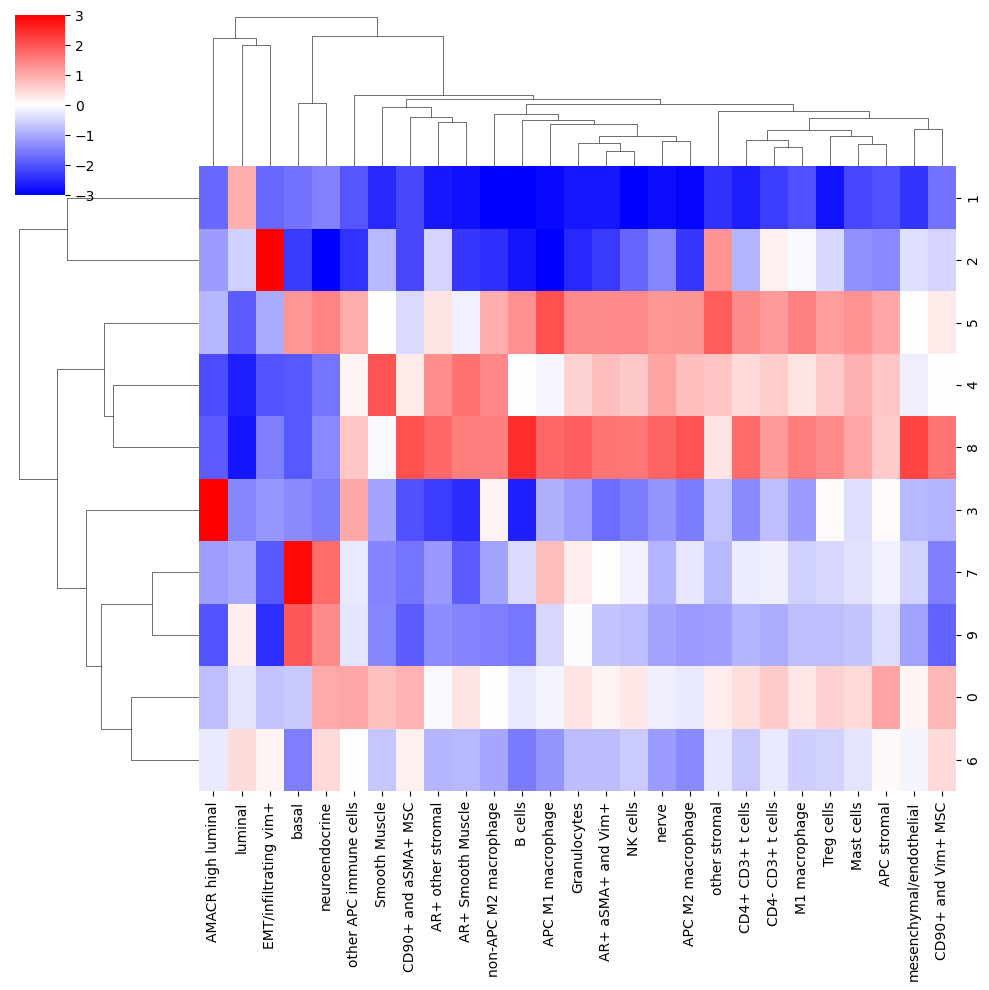

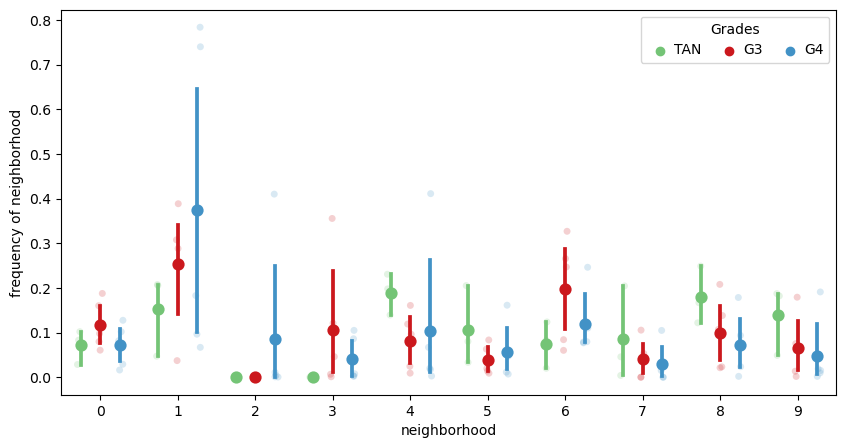

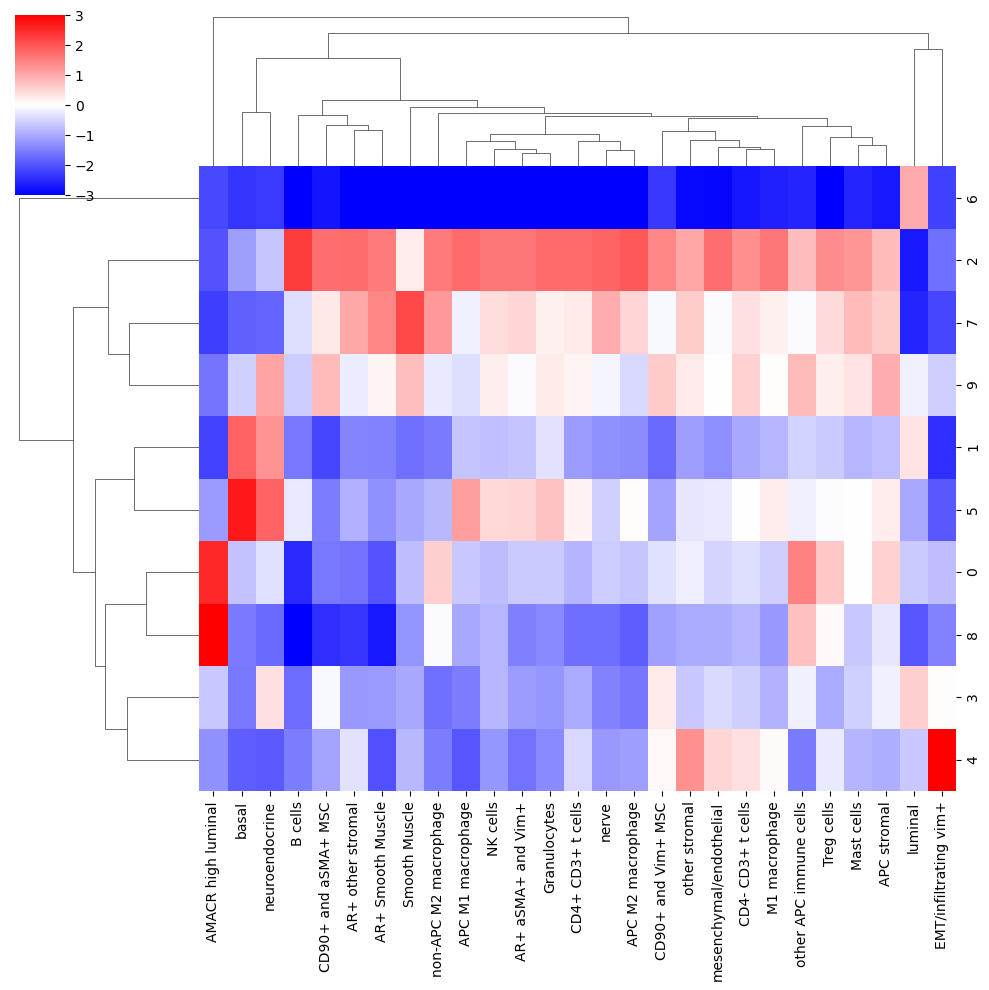

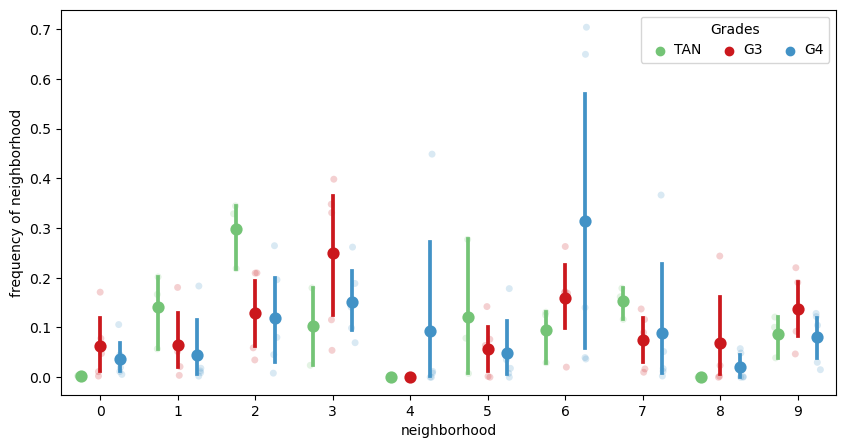

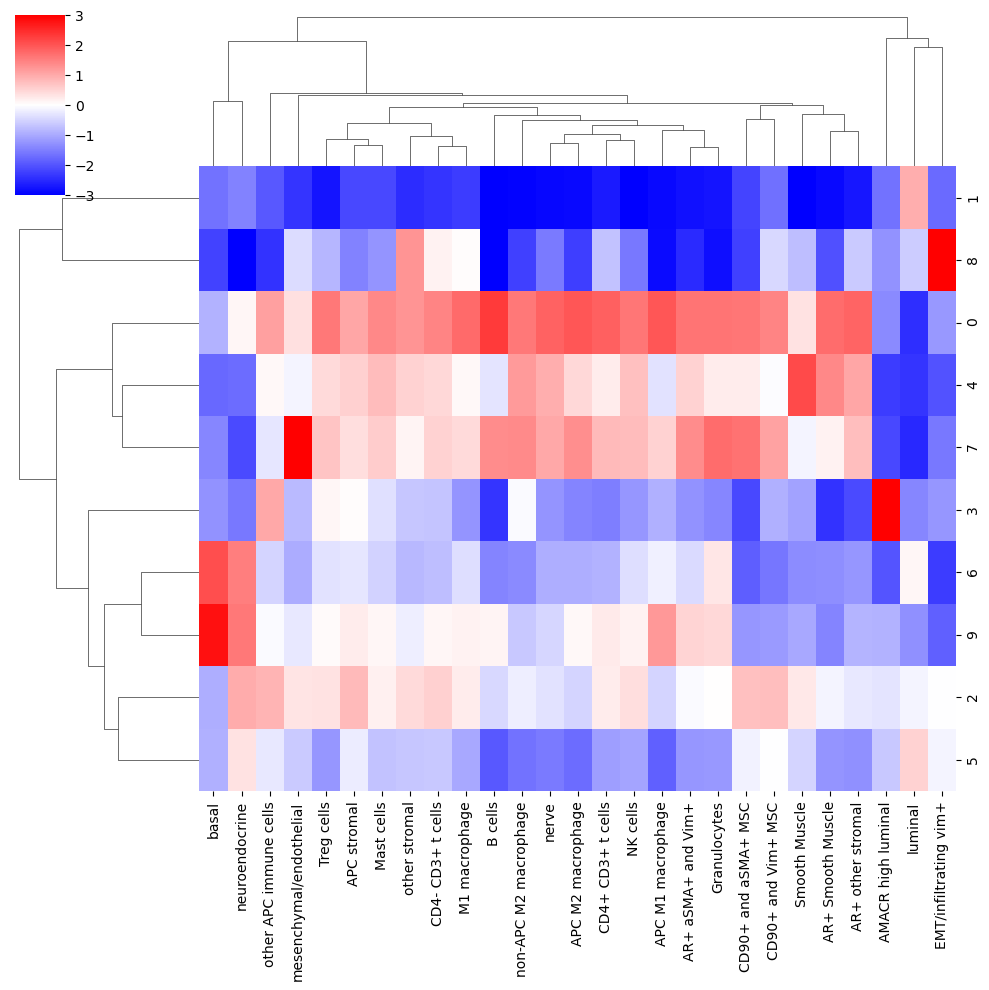

...

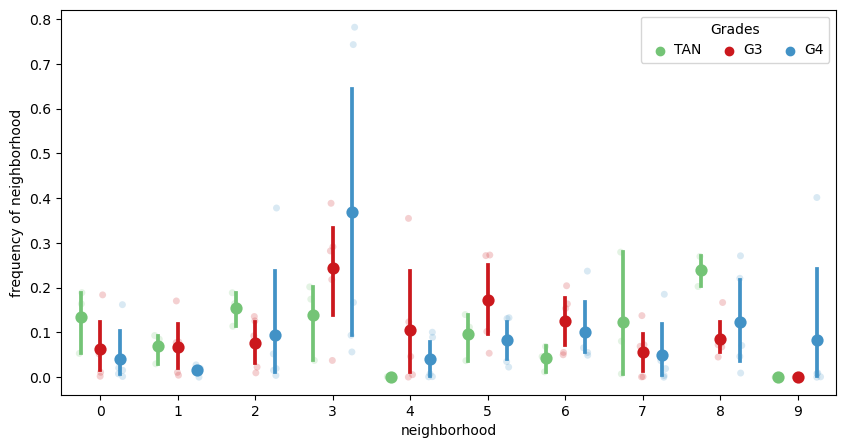

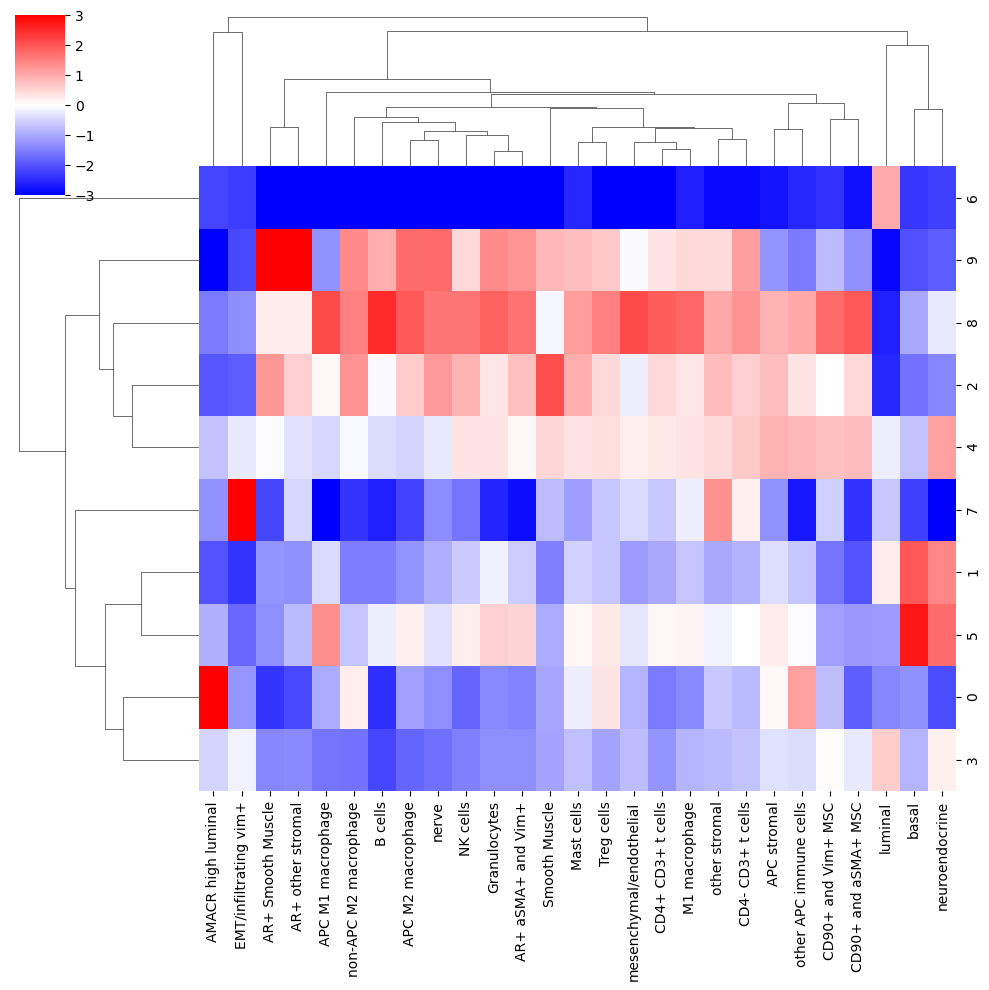

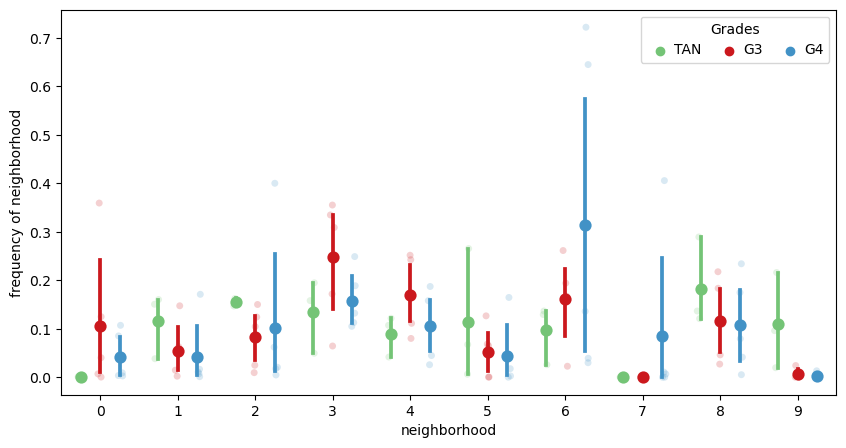

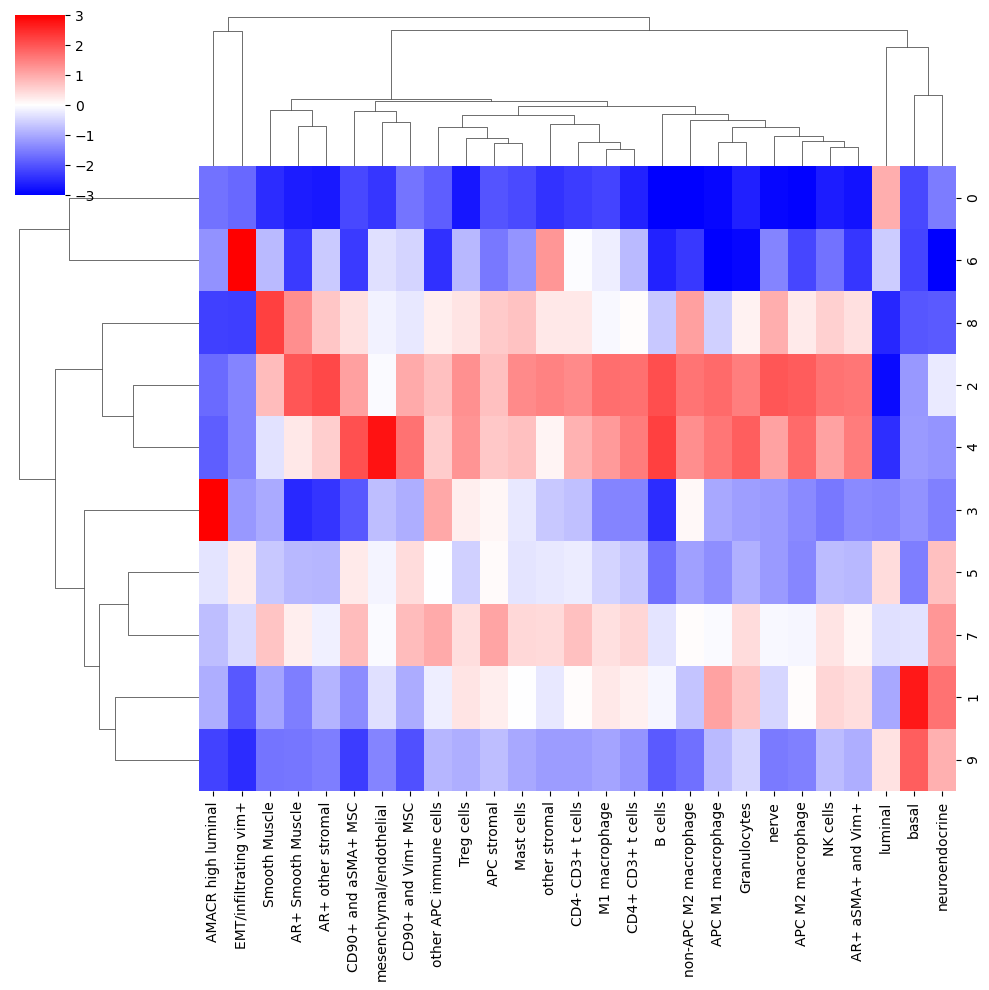

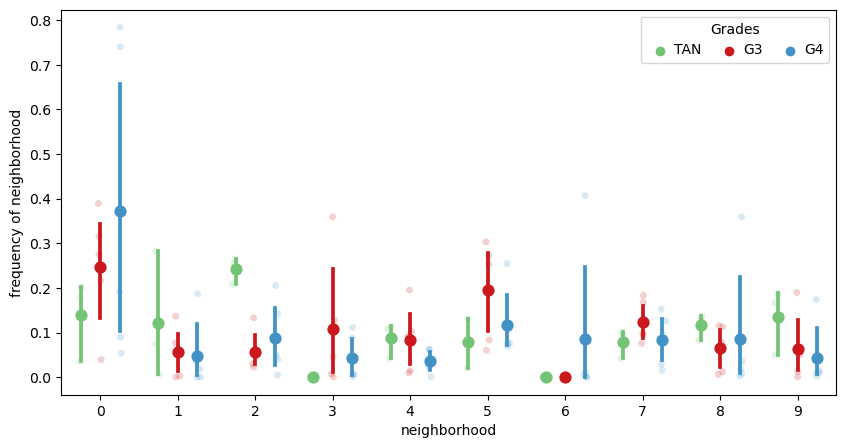

In [4]:
import random

for replication in range(100):
    
    random.seed(replication)
    ############
    #read in data and do some quick data rearrangement
    if file_type == 'pickle':
        cells = pd.read_pickle(path_to_data)
    if file_type == 'csv':
    #CA read data to be combined
        cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
        cells1_50 = cells1.sample(frac=0.50)
        cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
        cells2_50 = cells2.sample(frac=0.50)
        cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
        cells3_50 = cells3.sample(frac=0.50)
    
    #CA combine all data read with the next to line
    cells_3groups = [cells1_50, cells2_50, cells3_50]
    cells_all = pd.concat(cells_3groups)

    cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

    cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

    sum_cols = cells[cluster_col].unique()
    values = cells[sum_cols].values
    #############
    #find windows for each cell in each tissue region
    tissue_group = cells[[X,Y,reg]].groupby(reg)
    exps = list(cells[reg].unique())
    tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)] 
    tissues = [get_windows(job,n_neighbors) for job in tissue_chunks]
    #for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.
    out_dict = {}
    for k in ks:
        for neighbors,job in zip(tissues,tissue_chunks):

            chunk = np.arange(len(neighbors))#indices
            tissue_name = job[2]
            indices = job[3]
            window = values[neighbors[chunk,:k].flatten()].reshape(len(chunk),k,len(sum_cols)).sum(axis = 1)
            out_dict[(tissue_name,k)] = (window.astype(np.float16),indices)

    #concatenate the summed windows and combine into one dataframe for each window size tested.
    windows = {}
    for k in ks:
   
        window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
        window = window.loc[cells.index.values]
        window = pd.concat([cells[keep_cols],window],1)
        windows[k] = window
    k = 10
    n_neighborhoods = 10
    neighborhood_name = "neighborhood"+str(k)
    k_centroids = {}
    windows2 = windows[10]
    # windows2[cluster_col] = cells[cluster_col]

    km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)

    labelskm = km.fit_predict(windows2[sum_cols].values)
    k_centroids[k] = km.cluster_centers_
    cells['neighborhood10'] = labelskm
    cells[neighborhood_name] = cells[neighborhood_name].astype('category')
    #['reg064_A','reg066_A','reg018_B','reg023_A']
    # this plot shows the types of cells (ClusterIDs) in the different niches 
    k_to_plot = 10
    niche_clusters = (k_centroids[k_to_plot])
    tissue_avgs = values.mean(axis = 0)
    fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
    fc = pd.DataFrame(fc,columns = sum_cols)
    #s=sns.clustermap(fc.loc[[0,2,3,4,5,6,7,8,9],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = False)
    s=sns.clustermap(fc.loc[[0,1,2,3,4,5,6,7,8,9],], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = True)
    s.savefig("random50_ar_cn/celltypes_perniche_10_replication{}.pdf".format(replication))
    ar_cn=np.unique(np.concatenate((np.where(fc['AR+ aSMA+ and Vim+'] > 0),
               np.where(fc['AR+ Smooth Muscle'] > 0), 
               np.where(fc['AR+ other stromal'] > 0)), axis = None))
    #plot for each group and each patient the percent of total cells allocated to each neighborhood
    fc = cells.groupby(['patients','groups']).apply(lambda x: x['neighborhood10'].value_counts(sort = False,normalize = True))

    fc.columns = range(10)
    melt = pd.melt(fc.reset_index(),id_vars = ['patients','groups'])
    melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})
    f,ax = plt.subplots(figsize = (10,5))
    sns.stripplot(data = melt, hue = 'groups',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])
    sns.pointplot(data = melt, hue = 'groups',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:3], ['TAN', 'G3', 'G4'], title="Grades", #CA changed labels[:3] to ['TAN', 'G3', 'G4']
          handletextpad=0, columnspacing=1,
          loc="upper right", ncol=3, frameon=True)
    plt.savefig('random50_ar_cn/neighborhood_comparison_by_grade_replication{}.pdf'.format(replication))
    
    from scipy.stats import ttest_ind
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G3
    ttest_tan_g3 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g3.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==3]['frequency of neighborhood']))
    ttest_tan_g3 = pd.DataFrame(ttest_tan_g3)
    ttest_tan_g3 = ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g3.to_csv('random50_ar_cn/ttest_tan_g3_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G4
    ttest_tan_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g4.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_tan_g4 = pd.DataFrame(ttest_tan_g4)
    ttest_tan_g3= ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g4.to_csv('random50_ar_cn/ttest_tan_g4_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group G3 vs G4
    ttest_g3_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_g3_g4.append(ttest_ind(n2[n2['groups']==3]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_g3_g4 = pd.DataFrame(ttest_g3_g4)
    ttest_g3_g4 = ttest_g3_g4.loc[ar_cn,:]
    ttest_g3_g4.to_csv('random50_ar_cn/ttest_g3_g4_replication{}.csv'.format(replication), index=False)   